In [62]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.metrics import f1_score

from nn.src.Layers import LinearLayer, Sigmoid, Softmax
from nn.src.Losses import MSE, CrossEntropyLoss
from nn.src.Networks import MLP
from nn.src.Optimizers import Adam
from nn.src.utils import ScalingTransformer, DataLoader

os.chdir("..")

In [78]:
transformer = ScalingTransformer()
scaler = StandardScaler()
df_train, df_test = pd.read_csv("../mio1/regression/multimodal-sparse-training.csv"), pd.read_csv("../mio1/regression/multimodal-sparse-test.csv")
X_full_train = scaler.fit_transform(np.asarray(df_train["x"]).reshape(-1,1))
X_full_test = scaler.transform(np.asarray(df_test["x"]).reshape(-1,1))
y_full_train = transformer.fit_transform(np.asarray(df_train["y"]))
y_full_test = transformer.transform(np.asarray(df_test["y"]))
dataloader = DataLoader(X_full_train,y_full_train, batch_size=100)

In [79]:
def test(l1, l2):
    layers = [LinearLayer(1,5, l2=l2, l1=l1),
              Sigmoid(),
                LinearLayer(5,5, l2=l2, l1=l1),
                Sigmoid(),
                LinearLayer(5,1, l2=l2, l1=l1)
              ]
    net = MLP(layers)
    mse = MSE()
    optim = Adam(net.layers, lr=0.1)
    for epoch in range(10**6):
        for (X,y) in dataloader:
            y_hat = net(X)
            err = mse(y,y_hat)
            gradient = mse.derriv()
            net.backward(gradient)
            optim.step()
        if not epoch % 10000:
            plt.cla()
            print(epoch, mse(y_full_train, net(X_full_train)) , mse(y_full_test, net(X_full_test)))
            plt.scatter(X_full_test, net(X_full_test))
            plt.scatter(X_full_test, y_full_test)
            plt.show()

0 1.1491829372870452 0.9433433618174323


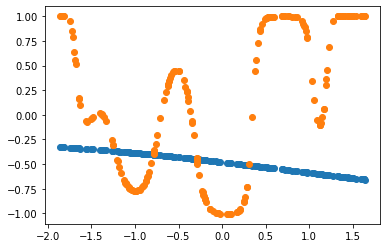

10000 0.022926835758746142 0.048902848667447055


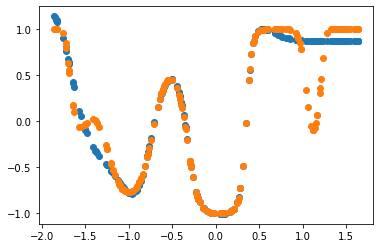

20000 0.0007083453754678386 0.02175792592968641


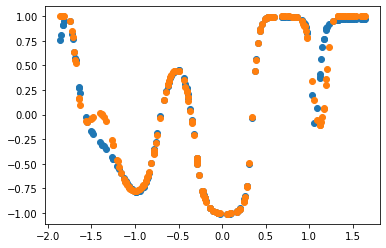

30000 0.0006983003552438265 0.022580745459841206


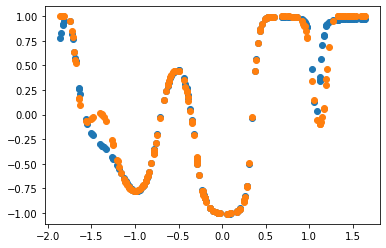

40000 0.0006961182797114487 0.0222470595243804


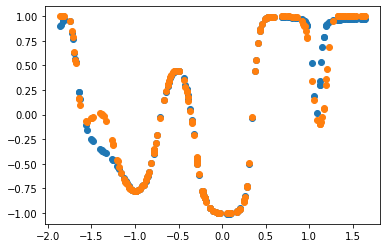

50000 0.0006844111245516121 0.021479731803404897


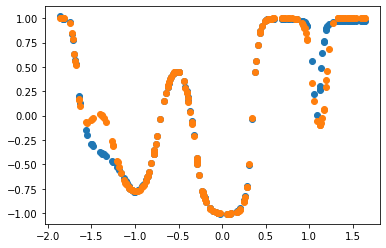

60000 0.0006921717212673851 0.021082235409461622


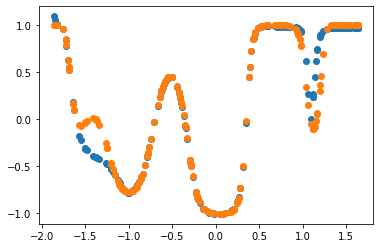

70000 0.0006802190884137224 0.01980452520693644


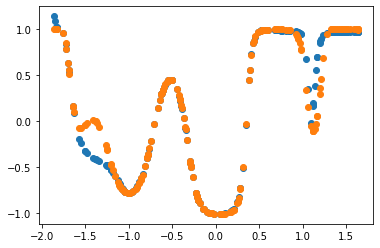

KeyboardInterrupt: 

In [65]:
test(0.,0.)

0 0.8380860480526546 0.697646678395946


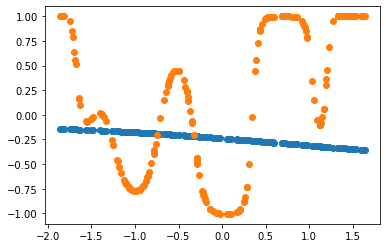

10000 0.024576838430197347 0.053760979618521866


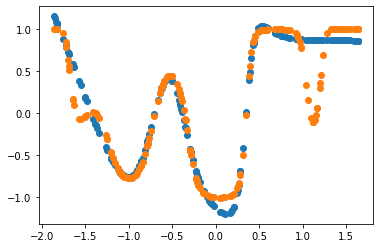

20000 0.025315123167725412 0.05591323949161563


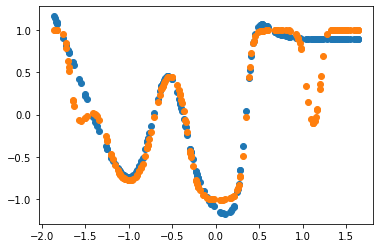

30000 0.024390296841896756 0.05342754202123992


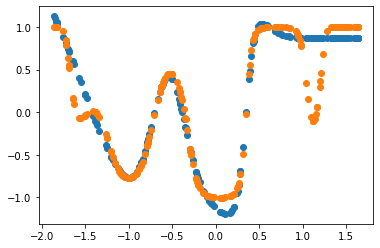

40000 0.022642445689024564 0.046734943562571116


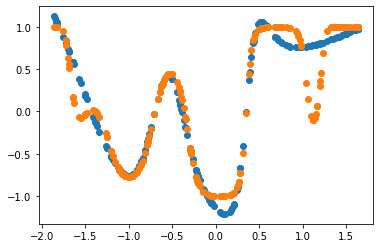

50000 0.022778393273126855 0.046999802709499


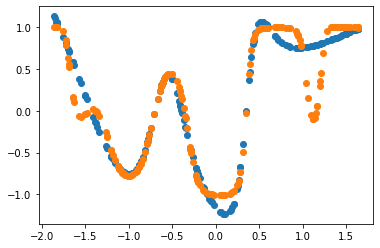

60000 0.02275360453023469 0.04694214937092614


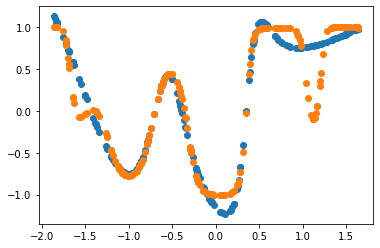

70000 0.02289340639654591 0.04769748288483372


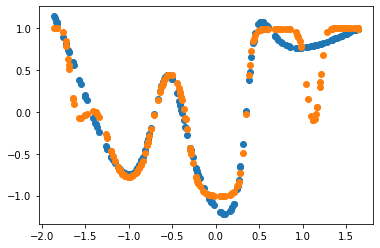

80000 0.022729619223665197 0.04674920278915035


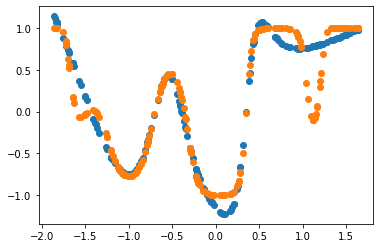

KeyboardInterrupt: 

In [80]:
test(0.,0.0001)

0 1.3128408800190063 1.0827167141791656


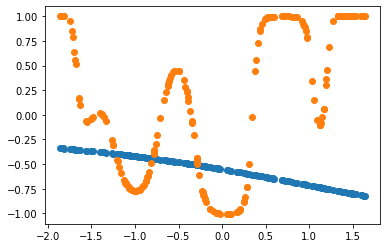

10000 0.023711168187265253 0.05249822188329551


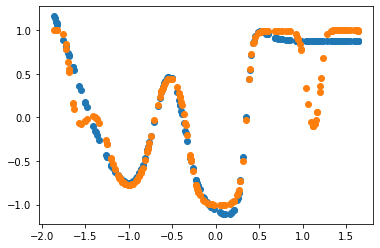

20000 0.023693120539954062 0.05180834919513511


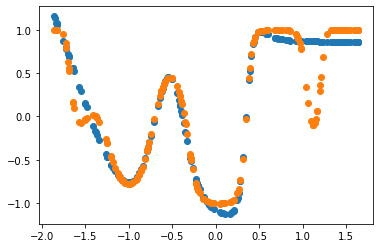

30000 0.02364518198828355 0.05204212465111246


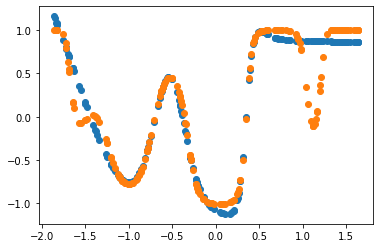

40000 0.023905191994592102 0.05312565498811853


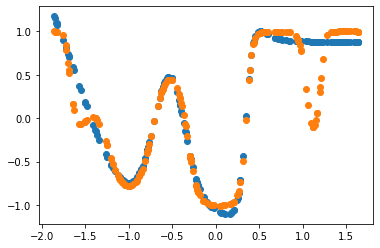

50000 0.023751320035881426 0.05178138042322861


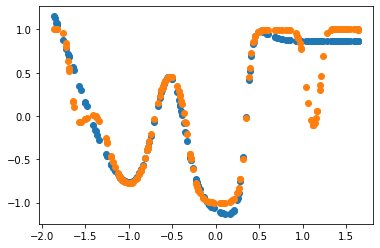

60000 0.02365265848159299 0.052293942875103895


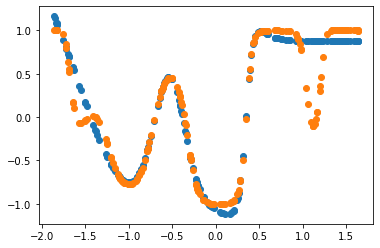

70000 0.023661211560905754 0.05200265245359545


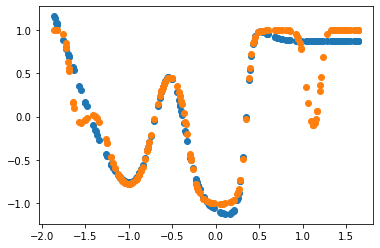

80000 0.023662827277136443 0.052370258783404774


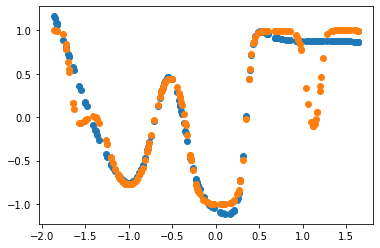

KeyboardInterrupt: 

In [81]:
test(0.0001,0.)

In [68]:
df_train, df_test = pd.read_csv("../mio1/classification/rings3-balance-training.csv"), pd.read_csv("../mio1/classification/rings3-balance-test.csv")
X_full_train, X_full_test = np.asarray(df_train.loc[:,("x","y")])/100, np.asarray(df_test.loc[:, ("x","y")]) / 100
y_full_train, y_full_test = np.asarray(df_train["c"]), np.asarray(df_test["c"])
encoder = OneHotEncoder(sparse = False)
y_full_train = encoder.fit_transform(y_full_train.reshape(-1, 1))
y_full_test = encoder.transform(y_full_test.reshape(-1, 1))
dataloader = DataLoader(X_full_train,y_full_train, batch_size=100)
def test2(l1, l2):
    layers = [LinearLayer(2,5, l2=l2, l1=l1),
              Sigmoid(),
                LinearLayer(5,5, l2=l2, l1=l1),
                Sigmoid(),
                LinearLayer(5,3, l2=l2, l1=l1),
                Softmax()
              ]
    net = MLP(layers)
    loss = CrossEntropyLoss()
    optim = Adam(net.layers, lr=0.1)
    for epoch in range(10**6):
        for (X,y) in dataloader:
            y_hat = net(X)
            err = loss(y,y_hat)
            gradient = loss.derriv()
            net.backward(gradient)
            optim.step()
        if not epoch % 1000:
            plt.cla()
            print(epoch,
                  f1_score(np.argmax(y_full_train, axis=1), np.argmax(net(X_full_train), axis = 1), average = "micro"),
                  f1_score(np.argmax(y_full_test, axis=1), np.argmax(net(X_full_test), axis = 1), average = "micro"))
            plt.scatter(X_full_test[:,0], X_full_test[:,1], c=np.argmax(net(X_full_test), axis=1))
            plt.show()


0 0.6815533980582524 0.399


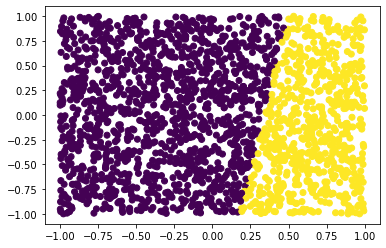

1000 0.9757281553398058 0.795


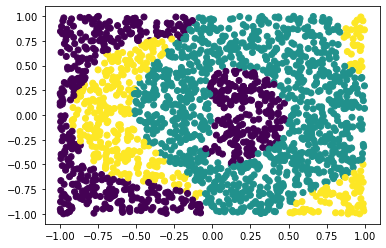

2000 0.9868932038834951 0.8445


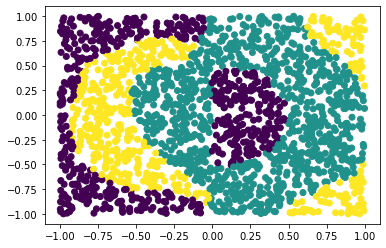

3000 0.9849514563106796 0.841


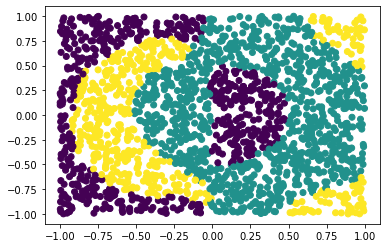

KeyboardInterrupt: 

In [69]:
test2(0.,0.)

0 0.4854368932038835 0.213


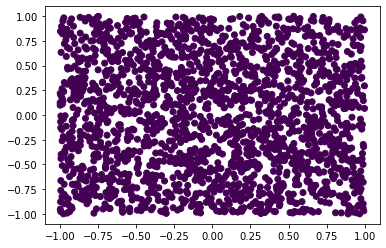

1000 0.9514563106796117 0.604


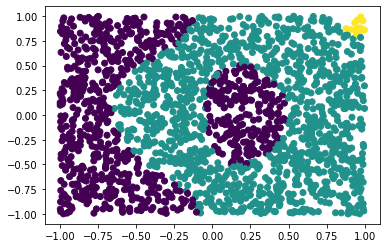

2000 0.9446601941747573 0.589


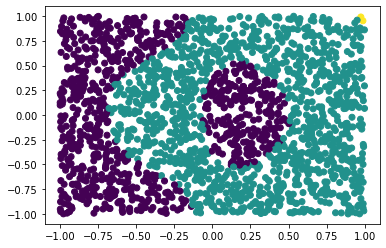

3000 0.9504854368932039 0.601


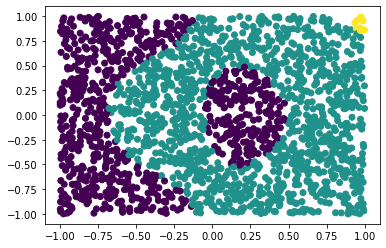

KeyboardInterrupt: 

In [71]:
test2(0.,0.0001)

0 0.6121359223300971 0.4115


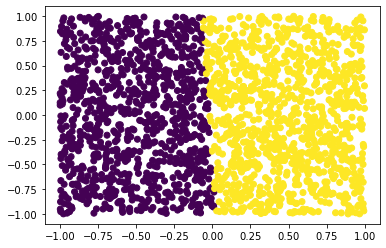

1000 0.987378640776699 0.8769999999999999


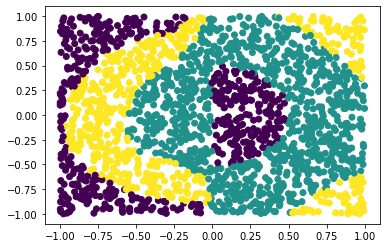

2000 0.9844660194174758 0.885


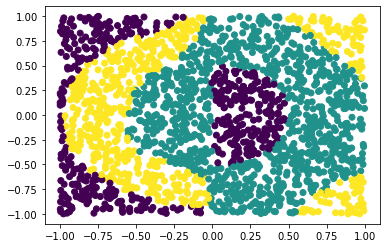

KeyboardInterrupt: 

In [72]:
test2(0.0001,0.)

In [73]:
df_train, df_test = pd.read_csv("../mio1/classification/xor3-balance-training.csv"), pd.read_csv("../mio1/classification/xor3-balance-test.csv")
X_full_train, X_full_test = np.asarray(df_train.loc[:,("x","y")])/100, np.asarray(df_test.loc[:, ("x","y")]) / 100
y_full_train, y_full_test = np.asarray(df_train["c"]), np.asarray(df_test["c"])
encoder = OneHotEncoder(sparse = False)
y_full_train = encoder.fit_transform(y_full_train.reshape(-1, 1))
y_full_test = encoder.transform(y_full_test.reshape(-1, 1))
dataloader = DataLoader(X_full_train,y_full_train, batch_size=100)
def test3(l1, l2):
    layers = [LinearLayer(2,5, l2=l2, l1=l1),
              Sigmoid(),
              LinearLayer(5,5, l2=l2, l1=l1),
              Sigmoid(),
              LinearLayer(5,2, l2=l2, l1=l1),
              Softmax()
              ]
    net = MLP(layers)
    loss = CrossEntropyLoss()
    optim = Adam(net.layers, lr=0.1)
    for epoch in range(10**6):
        for (X,y) in dataloader:
            y_hat = net(X)
            err = loss(y,y_hat)
            gradient = loss.derriv()
            net.backward(gradient)
            optim.step()
        if not epoch % 1000:
            plt.cla()
            print(epoch,
                    f1_score(np.argmax(y_full_train, axis=1), np.argmax(net(X_full_train), axis = 1), average = "micro"),
                  f1_score(np.argmax(y_full_test, axis=1), np.argmax(net(X_full_test), axis = 1), average = "micro"))
            plt.scatter(X_full_test[:,0], X_full_test[:,1], c=np.argmax(net(X_full_test), axis=1))
            plt.show()


0 0.9523809523809523 0.5525


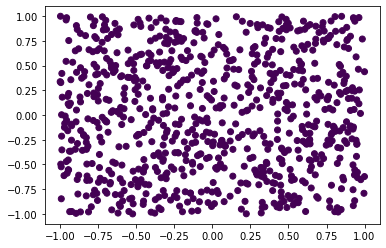

1000 0.9866666666666668 0.77125


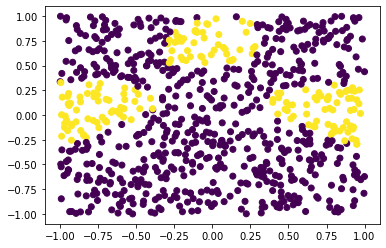

2000 0.9876190476190476 0.7925


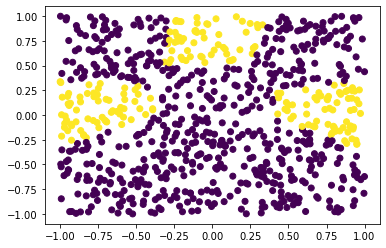

3000 0.9866666666666668 0.7725000000000001


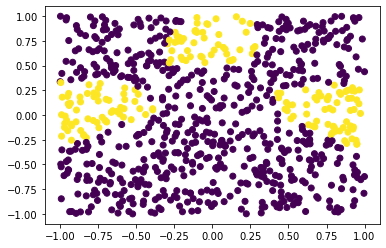

4000 0.9885714285714285 0.79625


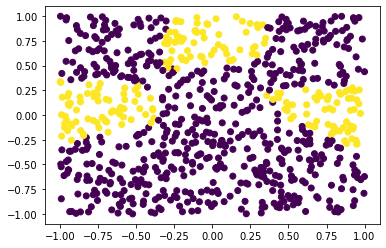

5000 0.9885714285714285 0.78125


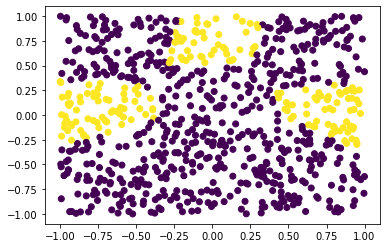

6000 0.9895238095238095 0.7875


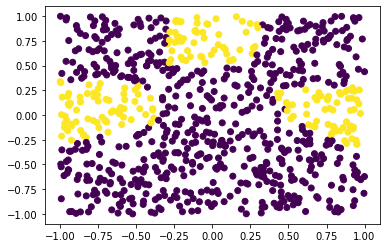

7000 0.9895238095238095 0.785


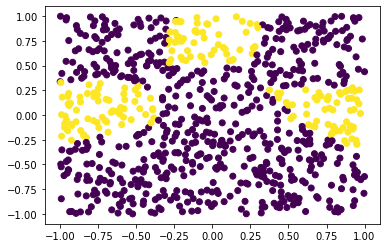

8000 0.9895238095238095 0.7887499999999998


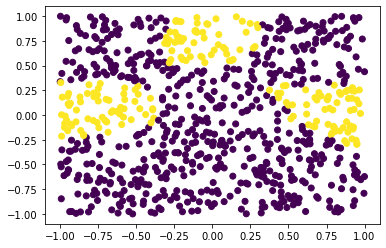

KeyboardInterrupt: 

In [74]:
test3(0.,0.)

0 0.9523809523809523 0.5525


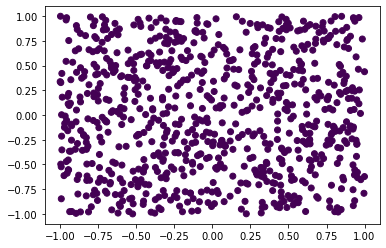

1000 0.9847619047619047 0.7875


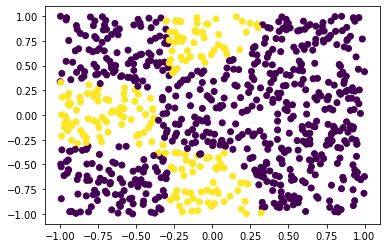

2000 0.9980952380952381 0.905


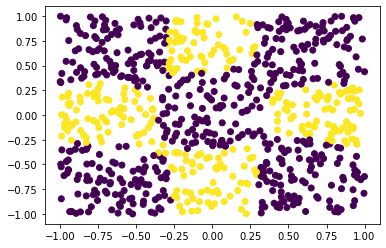

3000 0.9990476190476191 0.9275


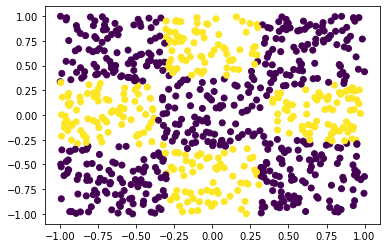

4000 1.0 0.935


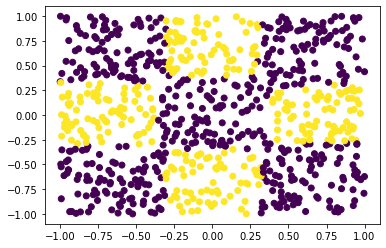

5000 0.9990476190476191 0.91875


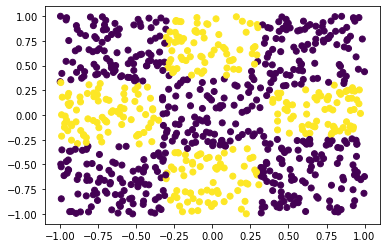

KeyboardInterrupt: 

In [75]:
test3(0.,0.00001)

0 0.9523809523809523 0.5525


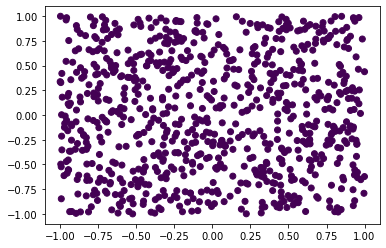

1000 0.9980952380952381 0.8975


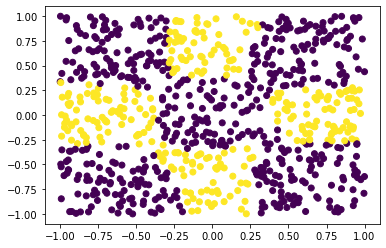

2000 0.9990476190476191 0.915


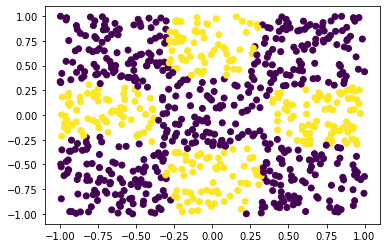

3000 0.9980952380952381 0.905


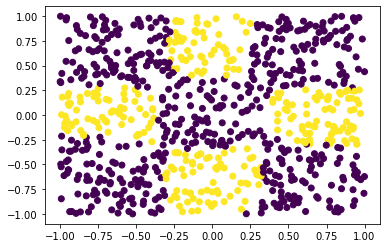

4000 0.9990476190476191 0.90625


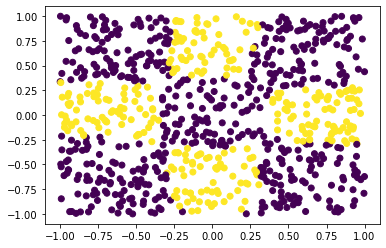

5000 1.0 0.92125


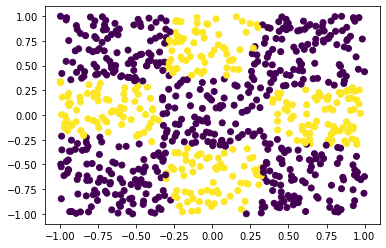

KeyboardInterrupt: 

In [76]:
test3(0.00001,0.)

In [82]:
df_train, df_test = pd.read_csv("../mio1/classification/rings5-sparse-training.csv"), pd.read_csv("../mio1/classification/rings5-sparse-test.csv")
X_full_train, X_full_test = np.asarray(df_train.loc[:,("x","y")])/100, np.asarray(df_test.loc[:, ("x","y")]) / 100
y_full_train, y_full_test = np.asarray(df_train["c"]), np.asarray(df_test["c"])
encoder = OneHotEncoder(sparse = False)
y_full_train = encoder.fit_transform(y_full_train.reshape(-1, 1))
y_full_test = encoder.transform(y_full_test.reshape(-1, 1))
dataloader = DataLoader(X_full_train,y_full_train, batch_size=100)
def test4(l1, l2):
    layers = [LinearLayer(2,5, l2=l2, l1=l1),
              Sigmoid(),
              LinearLayer(5,5, l2=l2, l1=l1),
              Sigmoid(),
              LinearLayer(5,5, l2=l2, l1=l1),
              Softmax()
              ]
    net = MLP(layers)
    loss = CrossEntropyLoss()
    optim = Adam(net.layers, lr=0.1)
    for epoch in range(10**6):
        for (X,y) in dataloader:
            y_hat = net(X)
            err = loss(y,y_hat)
            gradient = loss.derriv()
            net.backward(gradient)
            optim.step()
        if not epoch % 1000:
            plt.cla()
            print(epoch,
                    f1_score(np.argmax(y_full_train, axis=1), np.argmax(net(X_full_train), axis = 1), average = "micro"),
                  f1_score(np.argmax(y_full_test, axis=1), np.argmax(net(X_full_test), axis = 1), average = "micro"))
            plt.scatter(X_full_test[:,0], X_full_test[:,1], c=np.argmax(net(X_full_test), axis=1))
            plt.show()

0 0.20000000000000004 0.0485


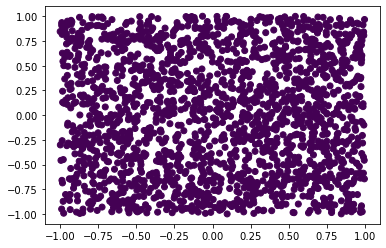

1000 0.935 0.8140000000000001


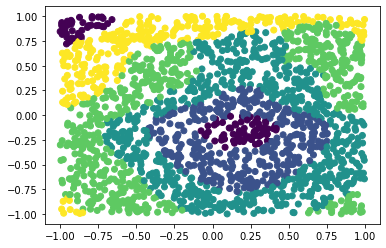

2000 0.955 0.8289999999999998


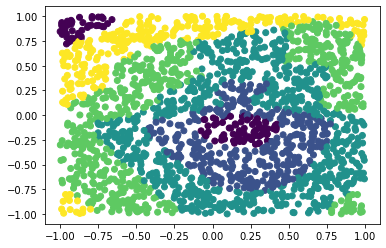

3000 0.965 0.8215


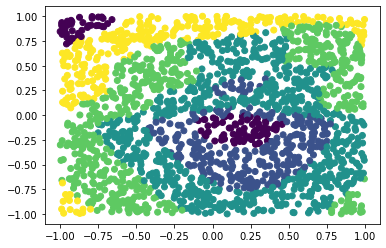

4000 0.965 0.806


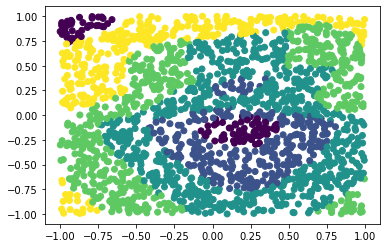

5000 0.97 0.807


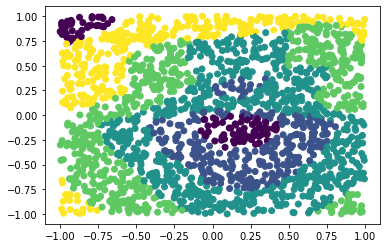

6000 0.975 0.807


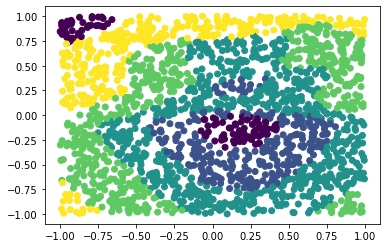

7000 0.97 0.808


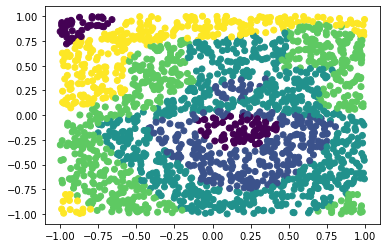

8000 0.97 0.813


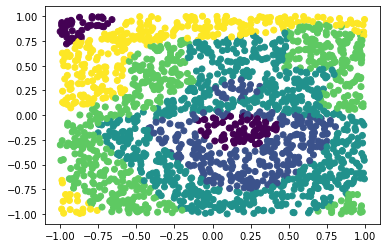

9000 0.97 0.8145


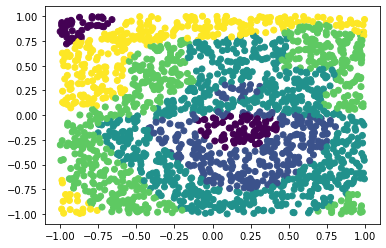

10000 0.97 0.8215


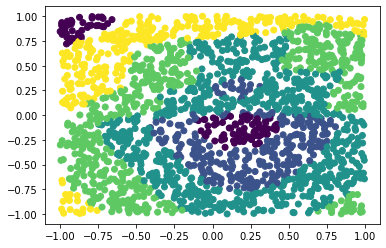

11000 0.97 0.8195


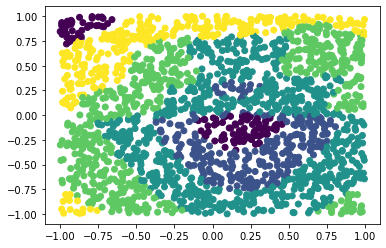

12000 0.975 0.817


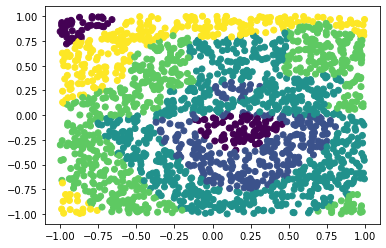

13000 0.97 0.8115


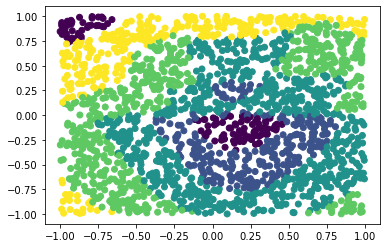

KeyboardInterrupt: 

In [83]:
test4(0.,0.)

0 0.20000000000000004 0.117


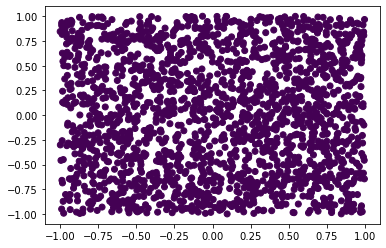

1000 0.96 0.857


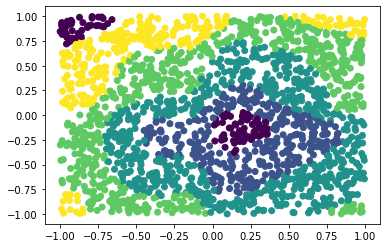

2000 0.96 0.864


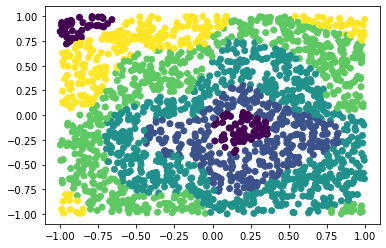

3000 0.97 0.8769999999999999


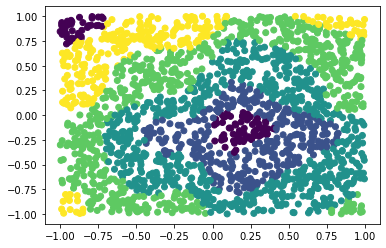

4000 0.97 0.8735


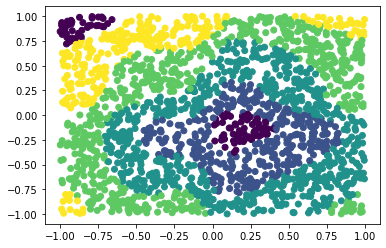

5000 0.965 0.8695


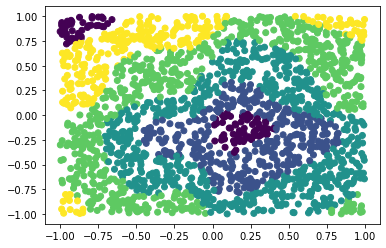

6000 0.97 0.8685


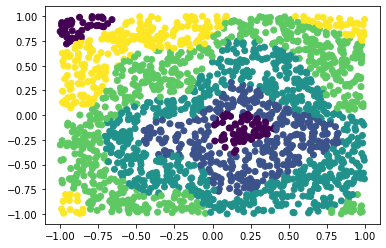

7000 0.965 0.8729999999999999


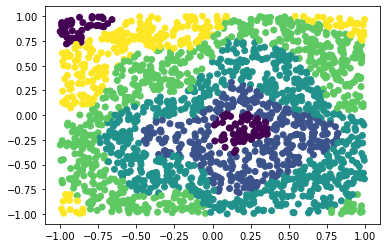

8000 0.965 0.8755


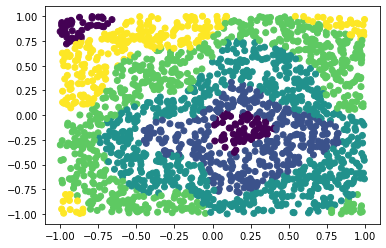

9000 0.96 0.869


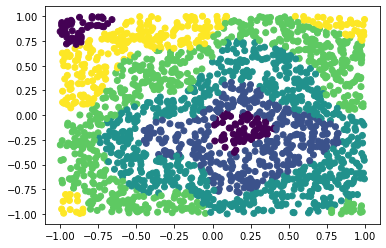

10000 0.97 0.8769999999999999


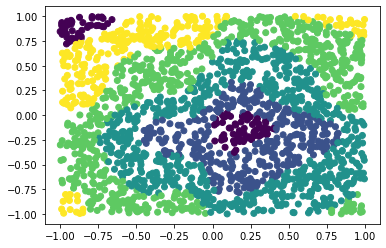

11000 0.965 0.8745


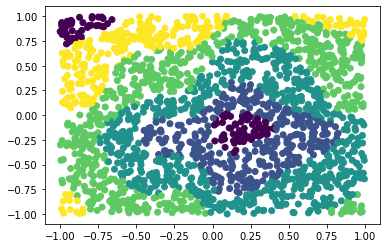

12000 0.97 0.878


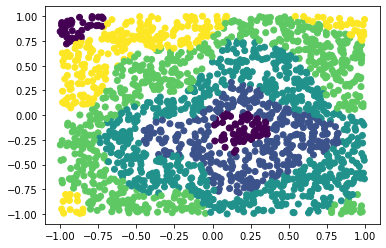

13000 0.965 0.8675


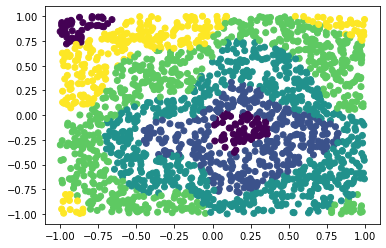

14000 0.965 0.8759999999999999


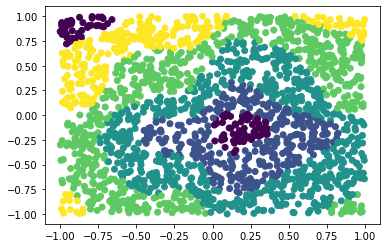

15000 0.97 0.8755


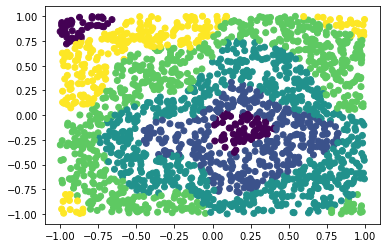

16000 0.97 0.8759999999999999


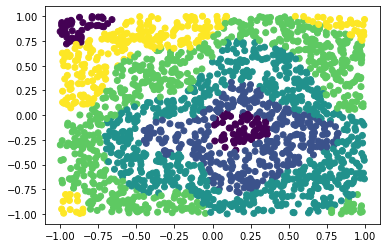

17000 0.965 0.8725


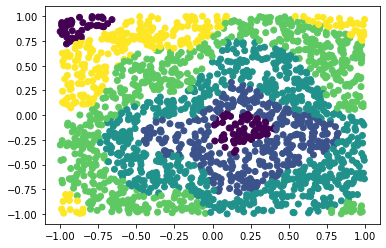

18000 0.97 0.8705


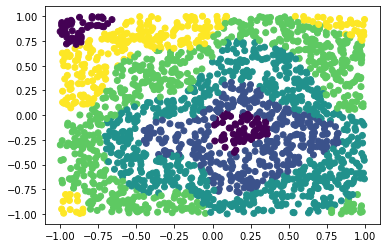

19000 0.97 0.869


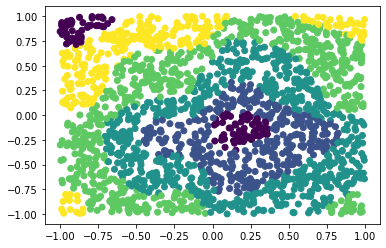

KeyboardInterrupt: 

In [85]:
test4(0.,0.0001)

0 0.20000000000000004 0.342


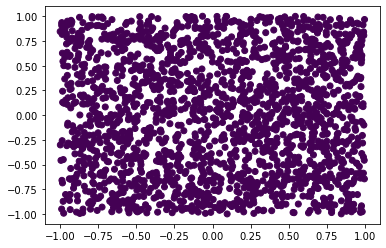

1000 0.955 0.869


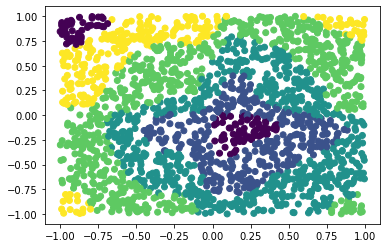

2000 0.985 0.889


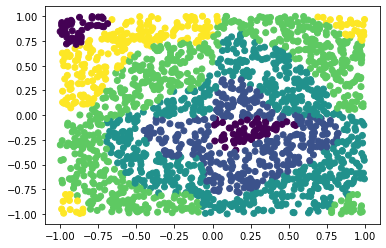

3000 0.985 0.8985


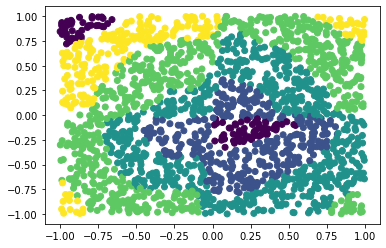

4000 0.99 0.8975


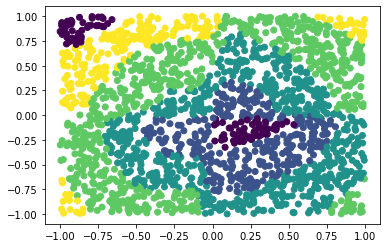

5000 0.99 0.9


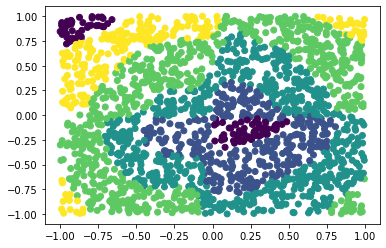

6000 0.995 0.8975


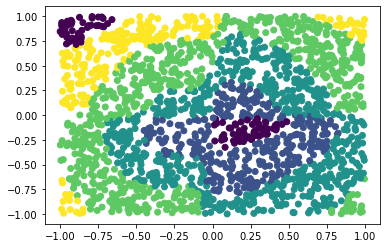

7000 1.0 0.8995


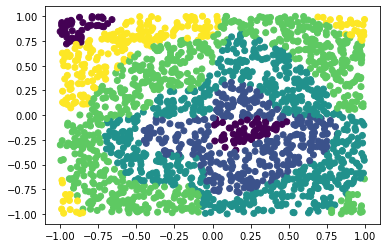

8000 0.99 0.8985


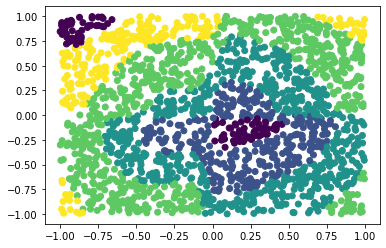

9000 0.995 0.8975


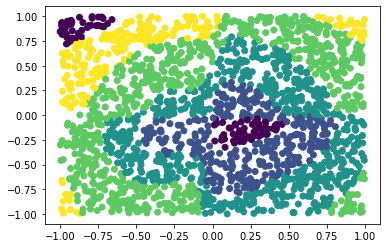

10000 1.0 0.8960000000000001


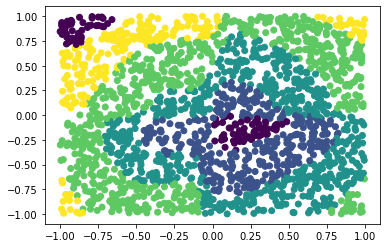

11000 1.0 0.897


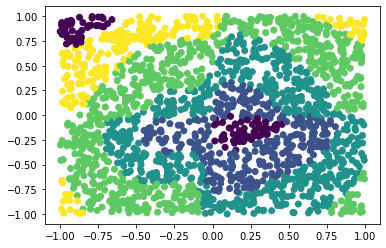

KeyboardInterrupt: 

In [86]:
test4(0.0001,0.)